In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

from sklearn.cluster import SpectralClustering
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import plotly.graph_objects as go

import sys
sys.path.append('..')
sys.path.insert(0, '../maldi_PIKE/maldi-learn/maldi_learn/')
sys.path.insert(0, '../Kernel/')

import warnings
warnings.filterwarnings('ignore')
import pickle

In [2]:
%matplotlib inline
%config InlineBackend.figure_format='retina'

In [3]:
import seaborn as sns
palette = 'Set2'
sns.set_style('ticks')
sns.set_context('paper')
sns.set_palette(palette)
plt.rcParams['font.family'] = 'serif'

# Load and preprocess dataset

We work with 2 main options:
- All peaks: linear-bins, log-bins, no bins
- Only non E.Coli peaks: linear-bins, log-bins, no bins

In [4]:
# Load data
mq_data = pd.read_csv('../../MALDI data/mq_data_zeros.csv', index_col='NUMERO')

# Labels
labels = pd.read_csv('../../MALDI data/cleaned_labels.csv')

# Labels
labels_df = labels.merge(mq_data, how='inner', left_on='NUMERO', right_on=mq_data.index)[labels.columns]
labels_df = labels_df[labels_df['AÑO'] < 2020]
labels_df['F REGISTRO'] = pd.to_datetime(labels_df['F REGISTRO'])
labels_df = labels_df.sort_values(by='F REGISTRO')
labels_df.index = labels_df.NUMERO

mq_data = mq_data.loc[mq_data.index.isin(labels_df.index)]

# Analyze Kernel Matrix

In [5]:
with open('../../MALDI data/complete_kernels.pkl', 'rb') as f:
    complete_kernel_dict = pickle.load(f)

with open('../../MALDI data/masked_kernels.pkl', 'rb') as f:
    masked_kernel_dict = pickle.load(f)

with open('../../MALDI data/peaks_kernels.pkl', 'rb') as f:
    peaks_kernel_dict = pickle.load(f)

with open('../../MALDI data/K_X_XR_kernels.pkl', 'rb') as f:
    K_X_XR_kernel_dict = pickle.load(f)

with open('../../MALDI data/K_XR_XR_kernels.pkl', 'rb') as f:
    K_XR_XR_kernel_dict = pickle.load(f)

with open('../../MALDI data/mock_MALDI.pkl', 'rb') as f:
    mock_MALDI = pickle.load(f)

with open('../../MALDI data/complete_prepared.pkl', 'rb') as f:
    complete_prepared_dict = pickle.load(f)

with open('../../MALDI data/masked_prepared.pkl', 'rb') as f:
    masked_prepared_dict = pickle.load(f)

with open('../../MALDI data/binned_complete.pkl', 'rb') as f:
    binned_ciomplete_dict = pickle.load(f)

with open('../../MALDI data/binned_masled.pkl', 'rb') as f:
    binned_masked_dict = pickle.load(f)

peaks_list = pd.read_excel('../../MALDI data/Proteinas ribosomales E. coli.xlsx', usecols='D', nrows=46).to_numpy()[1:]
peaks_list = peaks_list.astype(int).flatten()

1.0
[1. 1. 1. ... 1. 1. 1.]


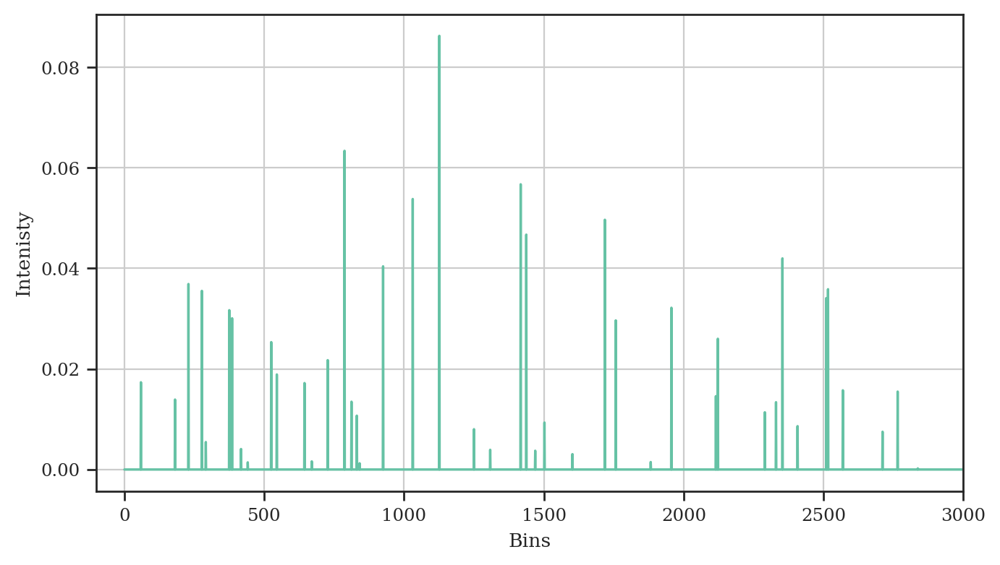

In [6]:
XRR = mock_MALDI['Ct. bins'].to_numpy()[0]
binned = binned_ciomplete_dict['Ct. bins'].to_numpy()
print(np.sum(XRR))
print(np.sum(binned, axis=1))

fig, ax = plt.subplots(1, 1, figsize=(7, 4), layout='tight')
ax.plot(XRR)
ax.set_xlabel("Bins")
ax.set_ylabel("Intenisty")
ax.set_xlim(-100, 3000)
ax.grid(True)

plt.savefig('c:/Users/rafar/Desktop/UC3M/2nd Semester/6 Master Thesis/Images/XRR.png', dpi=500) 
plt.show()

In [7]:
peaks_kernel_dict_pre = {}
for key, kernel in peaks_kernel_dict.items():
    ktr = kernel + K_X_XR_kernel_dict[key] @ np.ones((1, kernel.shape[0])) + np.ones((1, kernel.shape[0])).T @ K_X_XR_kernel_dict[key].T - K_XR_XR_kernel_dict[key] * np.ones_like(kernel)
    peaks_kernel_dict_pre[key] = ktr 
    print(np.min(peaks_kernel_dict_pre[key]), np.max(peaks_kernel_dict_pre[key]), np.mean(peaks_kernel_dict_pre[key]))
    print(np.min(K_X_XR_kernel_dict[key]), np.max(K_X_XR_kernel_dict[key]), np.mean(K_X_XR_kernel_dict[key]))
    print(np.min(K_XR_XR_kernel_dict[key]), np.max(K_XR_XR_kernel_dict[key]), np.mean(K_XR_XR_kernel_dict[key]))
    print("\n")

-3.756417282208591e+18 -6.501686064087501e+16 -1.6482442119252956e+18
3.854858615769806e+17 2.2311860723608387e+18 1.4395723967186286e+18
4.5273890053625523e+18 4.5273890053625523e+18 4.5273890053625523e+18


-3.3768496032673766e+17 1.8684108449993344e+17 -6.641567116038698e+16
6.037992084984414e+16 3.226429432631797e+17 1.960145654330195e+17
4.58444802026426e+17 4.58444802026426e+17 4.58444802026426e+17




In [7]:
def show_kernels(kernel_dict, figsize=(15, 7)):
    fig, axes = plt.subplots(1, len(list(kernel_dict.keys())), figsize=figsize, layout='tight', sharex=False, sharey=True)

    for i, (key, kernel) in enumerate(kernel_dict.items()):
        axes[i].imshow(kernel, cmap='viridis')
        axes[i].set_title(f'{key}', fontsize=13)
        
    for ax in axes:
        ax.axhline(y=1.0, color='k', linestyle='--')
        ax.grid()

    fig.show()

Show kernel matrices for non E.Coli ribosomic peaks

In [9]:
test = complete_kernel_dict['Ct. bins'] - peaks_kernel_dict['Ct. bins']
np.max(test)

0.032733369102408316

In [8]:
# Normalize before 
for key, kernel in peaks_kernel_dict.items():
    diag_K = np.diag(kernel)
    outer_diag_K = np.sqrt(np.outer(diag_K, diag_K))
    peaks_kernel_dict[key] = kernel / outer_diag_K

with open('../../MALDI data/peaks_kernels.pkl', 'wb') as f:
    pickle.dump(peaks_kernel_dict, f)

# plt.savefig('c:/Users/rafar/Desktop/UC3M/2nd Semester/6 Master Thesis/Images/peaks_kernel_unordered.png', dpi=500) 
# plt.show()

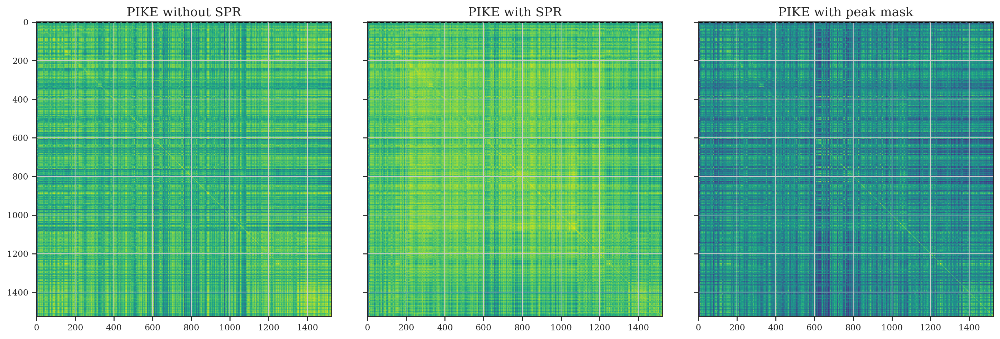

In [9]:
kernels_dict = {'PIKE without SPR': complete_kernel_dict['Ct. bins'],
                'PIKE with SPR': peaks_kernel_dict['Ct. bins'],
                'PIKE with peak mask': masked_kernel_dict['Ct. bins']
                }

show_kernels(kernels_dict, figsize=(15, 5))
plt.savefig('c:/Users/rafar/Desktop/UC3M/2nd Semester/6 Master Thesis/Images/kernels_unordered.png', dpi=500) 
plt.show()

Show kernel matrices for complete MALDI data

In [12]:
# show_kernel(complete_kernel_dict)

# plt.savefig('c:/Users/rafar/Desktop/UC3M/2nd Semester/6 Master Thesis/Images/complete_kernel_unordered.png', dpi=500) 
# plt.show()

In [13]:
# show_kernel(masked_kernel_dict)

# plt.savefig('c:/Users/rafar/Desktop/UC3M/2nd Semester/6 Master Thesis/Images/masked_kernel_unordered.png', dpi=500) 
# plt.show()

# Clustering

### Spectral Clustering

In [12]:
from scipy.spatial.distance import cdist

In [27]:
import numpy as np
from sklearn.cluster import SpectralClustering, KMeans
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt

def cluster_data(kernel, n_clusters, ids, plot_samples_per_cluster=True, key='', model='SC'):
    # Step 1: Perform Spectral Clustering or KMeans
    if model == 'SC':
        spectral = SpectralClustering(n_clusters=n_clusters, affinity='precomputed', random_state=10)
    elif model == 'SCRBF':
        spectral = SpectralClustering(n_clusters=n_clusters, affinity='rbf', random_state=10)
    elif model == 'kMeans':
        spectral = KMeans(n_clusters=n_clusters, n_init=5, random_state=10)
    
    spectral.fit(kernel)
    labels_sc = spectral.labels_

    # Step 2: Reorder cluster ids from more to less common
    unique, counts = np.unique(labels_sc, return_counts=True)
    cluster_counts = np.array(list(zip(unique, counts)))
    sorted_clusters = cluster_counts[cluster_counts[:, 1].argsort()[::-1], 0]
    new_cluster_mapping = {old: new for new, old in enumerate(sorted_clusters)}
    labels_sc = np.array([new_cluster_mapping[cluster] for cluster in labels_sc])

    # Step 3: Use KMeans to compute centroids
    kmeans = KMeans(n_clusters=n_clusters, random_state=10)
    kmeans.fit(kernel)  # Using the precomputed kernel for KMeans
    centroids = kmeans.cluster_centers_

    # Step 4: Calculate distances and sort IDs within each cluster
    sorted_ids_per_cluster = {}

    for cluster_idx in range(n_clusters):
        # Get the points belonging to this cluster
        cluster_mask = labels_sc == cluster_idx  # Create a boolean mask for current cluster
        cluster_points = kernel[cluster_mask]
        cluster_ids = np.array(ids)[cluster_mask]  # Get corresponding IDs

        # Compute the Euclidean distance to the centroid
        centroid = centroids[cluster_idx].reshape(1, -1)
        distances = cdist(cluster_points, centroid, metric='euclidean').flatten()

        # Get the sorted indices based on distance
        sorted_indices = np.argsort(distances)

        # Store the sorted IDs for this cluster
        sorted_ids_per_cluster[f"Cluster {cluster_idx}"] = list(cluster_ids[sorted_indices])

    # Step 5: Samples per cluster
    if plot_samples_per_cluster:
        unique_labels, counts = np.unique(labels_sc, return_counts=True)
        plt.figure(figsize=(15, 6))
        bars = plt.bar(unique_labels, counts)

        for bar, count in zip(bars, counts):
            plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), count, ha='center', va='bottom')

        plt.xticks(range(n_clusters))
        plt.yscale('log')
        plt.xlabel('Cluster Label')
        plt.ylabel('Number of Samples')
        plt.title(f'Number of Samples per Cluster: {key}')
        plt.show()
        
    return labels_sc, sorted_ids_per_cluster


We run two cluster selection approaches:
1. Silhouette Score based approach
2. Exponentiation based approach

No representative E.Coli peaks

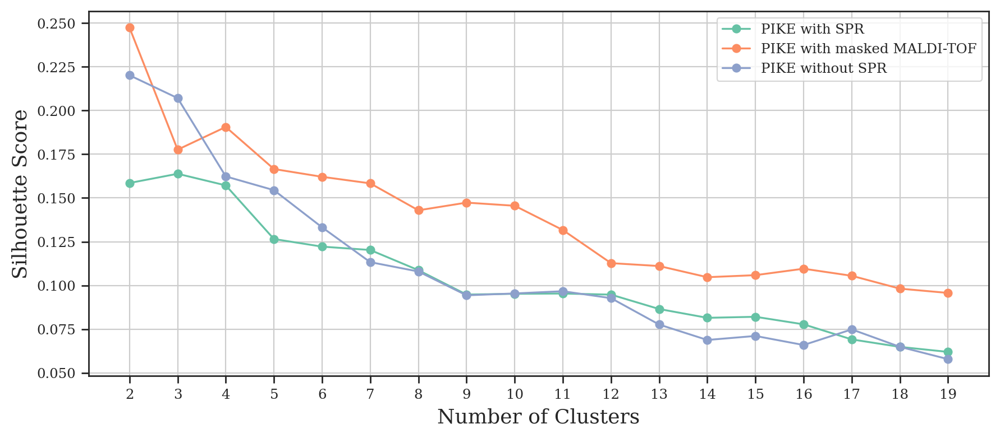

In [15]:
# PIKE + SPR
n_clusters_list = np.arange(2, 20)
peaks_cluster_sh = {key: [] for key, _ in peaks_kernel_dict.items() if key != 'Log bins'}

for n_clusters in n_clusters_list:
    for key, kernel in peaks_kernel_dict.items():
        if key == 'Log bins':
            continue
        # Cluster data
        labels_sc = cluster_data(kernel, n_clusters, plot_samples_per_cluster=False)

        # Convert kernel to distance
        diag_elements = np.diag(kernel)
        distance_kernel = np.sqrt(diag_elements[:, np.newaxis] + diag_elements[np.newaxis, :] - 2 * kernel)

        # Compute silhouette score
        sh = silhouette_score(distance_kernel, labels_sc, metric='precomputed')
        peaks_cluster_sh[key].append(sh)

fig, ax = plt.subplots(1, 1, figsize=(9, 4), layout='tight', sharey=True)
# ax.set_title('PIKE with SPR', fontsize=13)
ax.grid()
ax.set_xlabel('Number of Clusters', fontsize=13)
ax.set_ylabel('Silhouette Score', fontsize=13)
for key, value in peaks_cluster_sh.items():
    ax.plot(n_clusters_list, value, label='PIKE with SPR', marker='o')
    ax.set_xticks(n_clusters_list)
    ax.legend(loc='best')

# PIKE + masked MALDI
n_clusters_list = np.arange(2, 20)
masked_cluster_sh = {key: [] for key, _ in masked_kernel_dict.items() if key != 'Log bins'}

for n_clusters in n_clusters_list:
    for key, kernel in masked_kernel_dict.items():
        if key == 'Log bins':
            continue
        # Cluster data
        labels_sc = cluster_data(kernel, n_clusters, plot_samples_per_cluster=False)

        # Convert kernel to distance
        diag_elements = np.diag(kernel)
        distance_kernel = np.sqrt(diag_elements[:, np.newaxis] + diag_elements[np.newaxis, :] - 2 * kernel)

        # Compute silhouette score
        sh = silhouette_score(distance_kernel, labels_sc, metric='precomputed')
        masked_cluster_sh[key].append(sh)

# ax.set_title('PIKE with masked MALDI-TOF', fontsize=13)
ax.grid()
ax.set_xlabel('Number of Clusters', fontsize=13)
for key, value in masked_cluster_sh.items():
    ax.plot(n_clusters_list, value, label='PIKE with masked MALDI-TOF', marker='o')
    ax.set_xticks(n_clusters_list)
    ax.legend(loc='best')

# PIKE + no SPR
n_clusters_list = np.arange(2, 20)
complete_cluster_sh = {key: [] for key, _ in complete_kernel_dict.items() if key != 'Log bins'}

for n_clusters in n_clusters_list:
    for key, kernel in complete_kernel_dict.items():
        if key == 'Log bins':
            continue
        # Cluster data
        labels_sc = cluster_data(kernel, n_clusters, plot_samples_per_cluster=False)

        # Convert kernel to distance
        diag_elements = np.diag(kernel)
        distance_kernel = np.sqrt(diag_elements[:, np.newaxis] + diag_elements[np.newaxis, :] - 2 * kernel)

        # Compute silhouette score
        sh = silhouette_score(distance_kernel, labels_sc, metric='precomputed')
        complete_cluster_sh[key].append(sh)

# ax.set_title('PIKE without SPR', fontsize=13)
ax.grid()
ax.set_xlabel('Number of Clusters', fontsize=13)
for key, value in complete_cluster_sh.items():
    ax.plot(n_clusters_list, value, label='PIKE without SPR', marker='o')
    ax.set_xticks(n_clusters_list)
    ax.legend(loc='best')

# # KMeans
# baseline_dict = complete_prepared_dict.copy()
# baseline_dict.pop('Log bins')
# mq_data = mq_data.loc[mq_data.index.isin(labels_df.index)]
# baseline_dict['No Preprocessing'] = mq_data.to_numpy()
# baseline_dict['Ct. bins'] = baseline_dict['Ct. bins'][:,:,1]

# kmeans_cluster_sh = {key: [] for key, _ in baseline_dict.items()}

# for n_clusters in n_clusters_list:
#     for key, kernel in baseline_dict.items():
#         # Cluster data
#         labels_sc = cluster_data(kernel, n_clusters, plot_samples_per_cluster=False, model='kMeans')

#         # Compute silhouette score
#         sh = silhouette_score(kernel, labels_sc)
#         kmeans_cluster_sh[key].append(sh)

# ax[3].set_title('k-Means', fontsize=13)
# ax[3].grid()
# ax[3].set_xlabel('Number of Clusters', fontsize=13)
# for key, value in kmeans_cluster_sh.items():
#     ax[3].plot(n_clusters_list, value, label=key, marker='o')
#     ax[3].set_xticks(n_clusters_list)
#     ax[3].legend(loc='best')

# # RBF Kernel
# rbf_cluster_sh = {key: [] for key, _ in baseline_dict.items()}

# for n_clusters in n_clusters_list:
#     for key, kernel in baseline_dict.items():
#         # Cluster data
#         labels_sc = cluster_data(kernel, n_clusters, plot_samples_per_cluster=False, model='SCRBF')

#         # Compute silhouette score
#         try:
#             sh = silhouette_score(kernel, labels_sc)
#         except:
#             sh = None
#         rbf_cluster_sh[key].append(sh)

# ax[4].set_title('RBF Kernel', fontsize=13)
# ax[4].grid()
# ax[4].set_xlabel('Number of Clusters', fontsize=13)
# for key, value in rbf_cluster_sh.items():
#     ax[4].plot(n_clusters_list, value, label=key, marker='o')
#     ax[4].set_xticks(n_clusters_list)
#     ax[4].legend(loc='best')

plt.savefig('c:/Users/rafar/Desktop/UC3M/2nd Semester/6 Master Thesis/Images/sh_score.png', dpi=500) 
plt.show()

**BASELINE**
- KMeans: con/sin prprocesado, con preprocesado (ct y log binning)
- RBF Kernel: con/sin preprocesado (ct y log binning)

Finally, we compute a final clustering per option

In [28]:
n_clusters = 3
n_clusters_list = [n_clusters, n_clusters]
peaks_cluster_labels_dict = {}
peaks_sorted_ids_dict = {}

for (key, kernel), n_clusters in zip(peaks_kernel_dict.items(), n_clusters_list):
    print(key)
    ids = list(labels_df.index)
    labels_sc, sorted_ids = cluster_data(kernel, n_clusters, ids, plot_samples_per_cluster=False)
    peaks_cluster_labels_dict[key] = labels_sc
    peaks_sorted_ids_dict[key] = sorted_ids

Ct. bins
Log bins


In [31]:
import openpyxl
import pandas as pd

# Load the workbook and select the active sheet
file_path = '.\samples_per_clusters.xlsx'
wb = openpyxl.load_workbook(file_path)
sheet = wb.active  # You can specify the sheet name if needed

# Function to check if a cell has a background color
def has_background_color(cell):
    fill = cell.fill
    if fill and fill.fgColor:
        if fill.fgColor.type == 'rgb' and fill.fgColor.rgb != '00000000':  # Check for RGB colors
            return True
        if fill.fgColor.type == 'indexed' and fill.fgColor.indexed != 64:  # Check for indexed colors (64 means no color)
            return True
        if fill.fgColor.type == 'theme':  # Check for theme colors
            return True
    return False

# Extract data from the sheet, only keeping cells with a background color
filtered_data = []
for row in sheet.iter_rows(values_only=False):
    filtered_row = []
    for cell in row:
        if has_background_color(cell):
            filtered_row.append(cell.value)  # Keep the cell value if it has a background color
        else:
            filtered_row.append(None)  # Mark it as None if it doesn't match the criteria
    filtered_data.append(filtered_row)

# Convert the filtered data to a pandas DataFrame
columns = [cell.value for cell in sheet[1]]  # Assuming the first row contains headers
filtered_df = pd.DataFrame(filtered_data[1:], columns=columns)  # Exclude the header row

# Save the filtered data to a new Excel file
# filtered_df.to_excel('filtered_output.xlsx', index=False)

colored_cells_values = []

# Iterate through the cells and store values of those with a background color
for row in sheet.iter_rows(values_only=False):
    for cell in row:
        if has_background_color(cell):
            colored_cells_values.append(cell.value)  # Add the cell value to the list

# Display the list of colored cell values
print(colored_cells_values)

[18254745, 18254709, 18162011, 18201147, 18162488, 18162529, 18179241, 18117386, 18163029, 18202070, 18162535, 18118517, 18222700, 18222905, 18179400, 18203409, 18118492, 18118519, 18141572, 18117645, 18127212, 18117750, 18128338, 18128474, 18202092, 18163362, 18141454, 18223526, 18203398, 18162792, 18223988, 18133945, 18134314, 18131252, 18134426, 18138861, 18255543, 18137471, 18118442, 18134239, 18120806, 18150707, 18203711, 18153769, 18183827, 18163246, 18144339, 18144366, 18172632, 18223141, 18148858, 18149297, 18175701, 18150667, 18176117, 18151934, 18157533, 18151627, 18177237, 18158297, 18153545, 18120091, 18153614, 18183934, 18154511, 18158837, 18157274, 18163437, 18158093, 18258583, 18183767, 18189301, 18223231, 18158970, 18258127, 18191831, 18168858, 18183874, 18257242, 18169224, 18172123, 18193005, 18115979, 18194086, 18172297, 18172412, 18169675, 18172223, 18198338, 18142692, 18184569, 18144268, 18174458, 18174797, 18175045, 18173530, 18227682, 18175992, 18175005, 18211022,

In [32]:
def create_final_dictionary(sorted_clusters, original_ids):
    final_dict = {}
    
    # Iterate over each cluster in the sorted_clusters dictionary
    for cluster_key, sorted_ids in sorted_clusters.items():
        # Filter sorted IDs to include only those in the original IDs list
        filtered_ids = [id for id in sorted_ids if id in original_ids]
        
        # Assign the filtered list to the final dictionary under the cluster key
        final_dict[cluster_key] = filtered_ids

    return final_dict

In [34]:
final_dict = create_final_dictionary(peaks_sorted_ids_dict['Ct. bins'], colored_cells_values)
final_dict.keys()

dict_keys(['Cluster 0', 'Cluster 1', 'Cluster 2'])

In [35]:
def save_clusters_to_excel(cluster_dict, file_name='clusters.xlsx'):
    # Convert the dictionary to a DataFrame
    # Create a DataFrame with columns for each cluster
    df = pd.DataFrame(dict([(k, pd.Series(v)) for k, v in cluster_dict.items()]))
    
    # Save the DataFrame to an Excel file
    df.to_excel(file_name, index=False, engine='openpyxl')

In [36]:
save_clusters_to_excel(final_dict, 'most_similiar_samples_per_cluster.xlsx')

In [17]:
n_clusters_list = [n_clusters, n_clusters]
complete_cluster_labels_dict = {}

for (key, kernel), n_clusters in zip(complete_kernel_dict.items(), n_clusters_list):
    labels_sc = cluster_data(kernel, n_clusters, plot_samples_per_cluster=False, key=key)
    complete_cluster_labels_dict[key] = labels_sc

In [18]:
n_clusters_list = [n_clusters, n_clusters]
masked_cluster_labels_dict = {}

for (key, kernel), n_clusters in zip(masked_kernel_dict.items(), n_clusters_list):
    labels_sc = cluster_data(kernel, n_clusters, plot_samples_per_cluster=False, key=key)
    masked_cluster_labels_dict[key] = labels_sc

# Cluster Analysis

For each attribute we identify the clusters where the attribute is represented. Sample origin and hospital department are considered.

In [18]:
peaks_clusters_info_dict = {}

for key, labels in peaks_cluster_labels_dict.items():
    cluster_info_df = pd.DataFrame({
    'CLUSTER': labels,
    'RESISTENCIA': labels_df['RESISTENCIA'],
    'TIPO ECOLI': labels_df['TIPO ECOLI'],
    'SERVICIO': labels_df['SERVICIO'],
    'T MUESTRA': labels_df['T MUESTRA'],
    'F REGISTRO': labels_df['F REGISTRO']
    })

    peaks_clusters_info_dict[key] = cluster_info_df

with open('../../MALDI data/peaks_info_dict.pkl', 'wb') as f:
    pickle.dump(peaks_clusters_info_dict, f)

In [22]:
labels_df.index

Int64Index([18116817, 18116827, 18117021, 18117272, 18159792, 18162011,
            18159716, 18159598, 18159556, 18159513,
            ...
            19084536, 19086060, 19086083, 19105523, 19105575, 19105458,
            19130084, 19152818, 19174197, 19172763],
           dtype='int64', name='NUMERO', length=1525)

In [20]:
complete_clusters_info_dict = {}

for key, labels in complete_cluster_labels_dict.items():
    cluster_info_df = pd.DataFrame({
    'CLUSTER': labels,
    'RESISTENCIA': labels_df['RESISTENCIA'],
    'TIPO ECOLI': labels_df['TIPO ECOLI'],
    'SERVICIO': labels_df['SERVICIO'],
    'T MUESTRA': labels_df['T MUESTRA'],
    'F REGISTRO': labels_df['F REGISTRO']
    })

    complete_clusters_info_dict[key] = cluster_info_df

with open('../../MALDI data/complete_info_dict.pkl', 'wb') as f:
    pickle.dump(complete_clusters_info_dict, f)

In [21]:
masked_clusters_info_dict = {}

for key, labels in masked_cluster_labels_dict.items():
    cluster_info_df = pd.DataFrame({
    'CLUSTER': labels,
    'RESISTENCIA': labels_df['RESISTENCIA'],
    'TIPO ECOLI': labels_df['TIPO ECOLI'],
    'SERVICIO': labels_df['SERVICIO'],
    'T MUESTRA': labels_df['T MUESTRA'],
    'F REGISTRO': labels_df['F REGISTRO']
    })

    masked_clusters_info_dict[key] = cluster_info_df

with open('../../MALDI data/masked_info_dict.pkl', 'wb') as f:
    pickle.dump(masked_clusters_info_dict, f)

Firts we analyze each cluster in a general manner

In [22]:
def summarize_df(df):
    cluster_counts = df['CLUSTER'].value_counts().sort_index()

    resistance_proportion = df.groupby('CLUSTER')['RESISTENCIA'].mean()
    tipo_ecoli_proportions = df.pivot_table(index='CLUSTER', columns='TIPO ECOLI', aggfunc='size', fill_value=0)
    tipo_ecoli_proportions = tipo_ecoli_proportions.div(tipo_ecoli_proportions.sum(axis=1), axis=0)

    summary_df = pd.DataFrame({
        'Cluster Number': cluster_counts.index,
        'Number of Samples': cluster_counts.values,
        'Proportion of RESISTENCIA': resistance_proportion.values,
        'Proportion of TIPO ECOLI 0': tipo_ecoli_proportions.get(0, 0).values,
        'Proportion of TIPO ECOLI 1': tipo_ecoli_proportions.get(1, 0).values,
        'Proportion of TIPO ECOLI 2': tipo_ecoli_proportions.get(2, 0).values,
    })
    summary_df = summary_df.applymap(lambda x: f'{x:.3f}' if isinstance(x, (float)) else x)

    fig = go.Figure(data=[go.Table(
    header=dict(values=list(summary_df.columns),
                fill_color='paleturquoise',
                align='center'),
    cells=dict(values=[summary_df[col] for col in summary_df.columns],
               fill_color='lavender',
               align='left'))
    ])

    fig.show()

In [23]:
for key, value in complete_clusters_info_dict.items():
    print(key)
    summarize_df(value)

Ct. bins


Log bins


In [24]:
for key, value in masked_clusters_info_dict.items():
    print(key)
    summarize_df(value)

Ct. bins


Log bins


In [25]:
for key, value in peaks_clusters_info_dict.items():
    print(key)
    summarize_df(value)

Ct. bins


Log bins


Plot mean MALDI for each cluster

In [26]:
mz_range = np.arange(2000, 20000)
bin_size = 3
num_bins = len(mz_range) // bin_size

histogram_heights = np.zeros(num_bins)
bin_indices = (peaks_list - 2000) // bin_size
for idx in bin_indices:
    histogram_heights[max(0, idx - 10):min(num_bins, idx + 10)] = 0.6

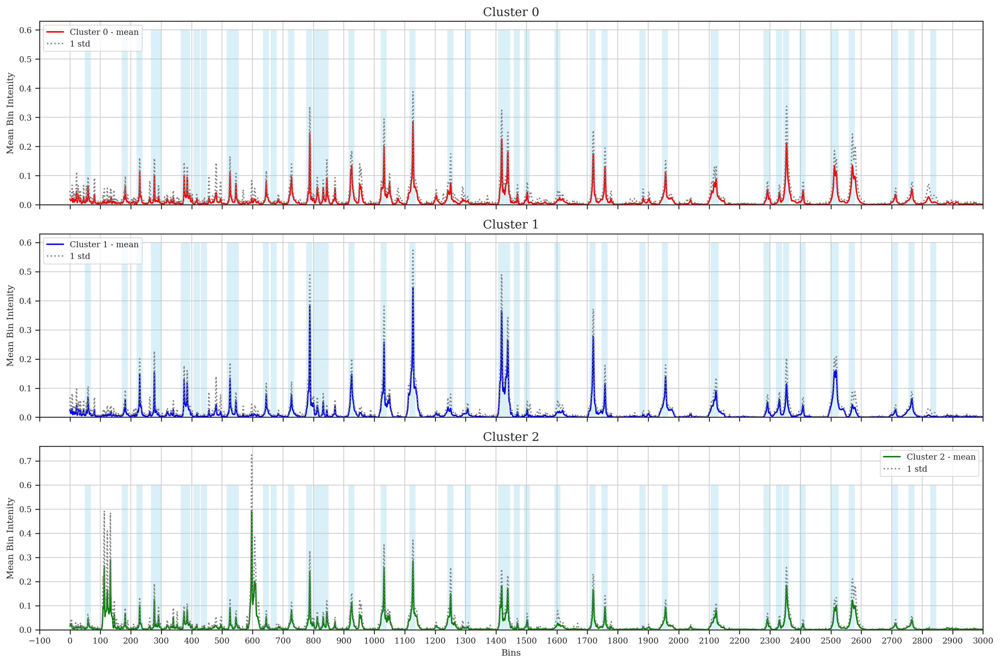

In [27]:
fig, axes = plt.subplots(n_clusters, 1, figsize=(15, 10), layout='tight', sharex=True)
colors = ['red', 'blue', 'green', 'orange']

labels = peaks_cluster_labels_dict['Ct. bins']
value_data = complete_prepared_dict['Ct. bins'][:,:,1] / np.max(complete_prepared_dict['Ct. bins'][:,:,1])
value_df = pd.DataFrame(value_data)
value_df['label'] = labels
    
cluster_means = value_df.groupby('label').mean()
cluster_std = value_df.groupby('label').std()
cluster_means = cluster_means.drop(columns='label', errors='ignore')
cluster_means_plus_std = cluster_means + 1 * cluster_std

for i in range(cluster_means.shape[0]):
    axes[i].plot(cluster_means.to_numpy()[i,:], label=f'Cluster {i} - mean', linewidth=1.5, color=colors[i])
    axes[i].plot(cluster_means_plus_std.to_numpy()[i,:], label=f'1 std', linewidth=1.5, color='gray', linestyle='dotted')
    axes[i].bar(range(num_bins), histogram_heights, width=1.0, alpha=0.3, edgecolor='none', color='skyblue')
    axes[i].set_title(f"Cluster {i}", fontsize=13)
    axes[i].set_xticks(np.arange(-100, 3100, 100))
    axes[i].set_ylabel(f"Mean Bin Intenity")
    axes[i].set_xlim(-100, 3000)
    axes[i].legend()
    axes[i].grid()

axes[-1].set_xlabel(f"Bins")

plt.savefig('c:/Users/rafar/Desktop/UC3M/2nd Semester/6 Master Thesis/Images/mean_MALDI.png', dpi=500) 
plt.show()

Function to plot desired figures

In [58]:
from matplotlib.cm import get_cmap

In [59]:
def plot_samples_over_time(df, plot=[], time_unit='month', fig_title=None, filter_servicios=True, th_ser=20, 
                           filter_muestra=True, th_muest=10, top_n_clusters=None, figsize=(15, 10)):
    # Filter non relevant Servicios
    if filter_servicios and 'SERVICIO' in plot:
        servicio_counts = df['SERVICIO'].value_counts()
        servicio_filter = servicio_counts[servicio_counts > th_ser].index
        df = df[df['SERVICIO'].isin(servicio_filter)]

    # Group samples based on time_unit
    if time_unit == 'month':
        grouped_time = df.groupby([df['F REGISTRO'].dt.year, df['F REGISTRO'].dt.month])
        grouped_servicio = df.groupby([df['F REGISTRO'].dt.year, df['F REGISTRO'].dt.month, 'CLUSTER', 'SERVICIO'])
        grouped_cluster = df.groupby([df['F REGISTRO'].dt.year, df['F REGISTRO'].dt.month, 'CLUSTER'])
    elif time_unit == 'week':
        grouped_time = df.groupby([df['F REGISTRO'].dt.year, df['F REGISTRO'].dt.week])
        grouped_servicio = df.groupby([df['F REGISTRO'].dt.year, df['F REGISTRO'].dt.week, 'CLUSTER', 'SERVICIO'])
        grouped_cluster = df.groupby([df['F REGISTRO'].dt.year, df['F REGISTRO'].dt.week, 'CLUSTER'])
    elif time_unit == 'day':
        grouped_time = df.groupby([df['F REGISTRO'].dt.date])
        grouped_servicio = df.groupby([df['F REGISTRO'].dt.date, 'CLUSTER', 'SERVICIO'])
        grouped_cluster = df.groupby([df['F REGISTRO'].dt.date, 'CLUSTER'])
    else:
        raise ValueError("Invalid time_unit, choose from: 'month', 'week', or 'day'")
    
    # Count the number of samples in each group
    counts_date = grouped_time.size()
    counts_servicio = grouped_servicio.size().unstack(fill_value=0)
    counts_cluster = grouped_cluster.size().unstack(fill_value=0)

    full_index = pd.MultiIndex.from_product([counts_servicio.index.levels[0], counts_servicio.index.levels[1], 
                                             range(4)], names=['F REGISTRO', 'MONTH', 'CLUSTER'])
    counts_servicio = counts_servicio.reindex(full_index, fill_value=0)
    
    top_n_clusters_df = counts_cluster.copy()
    n_unique_clusters = df['CLUSTER'].unique()

    if top_n_clusters is not None:
        for idx, row in top_n_clusters_df.iterrows():
            top_n_clusters_df.loc[idx] = row.nlargest(top_n_clusters)

    if len(plot) == 0:
        fig, axes = plt.subplots(1, 1, layout='tight', sharex=True, figsize=figsize)
        axes_0 = axes
    else:
        fig, axes = plt.subplots(len(n_unique_clusters) + 1, 1, layout='tight', sharex=True, figsize=figsize)
        axes_0 = axes[0]

    # Plot time evolution
    counts_date.plot(kind='line', ax=axes_0, legend=False, xlabel='', style='--', label='Monthly sum')
    axes_0.set_ylabel('Number of Samples')
    axes_0.set_title('Time Evolution')
    axes_0.grid()

    cmap = get_cmap('tab20c')
    num_servicios = len(df['SERVICIO'].unique())
    colors = cmap(np.linspace(0, 1, num_servicios))

    # Plot SERVICIO
    for i in n_unique_clusters:
        if 'SERVICIO' in plot:
            cluster_servicio_df = counts_servicio.loc[(slice(None), slice(None), i, slice(None)), :]
            axes[i+1].set_prop_cycle(color=colors)
            cluster_servicio_df.plot(kind='line', marker='o', ax=axes[i+1], legend=False, xlabel='')
            axes[i+1].set_ylabel('Number of Samples', fontsize=10)
            axes[i+1].set_title(f'Cluster {i} - Number of Samples per Department', fontsize=10)
            axes[i+1].legend(loc='best', fontsize='xx-small', ncol=1)
            axes[i+1].grid(True)
            axes[i+1].set_ylim(-1, 16)
            axes[i+1].set_yticks(range(0, 19))

    # Plot CLUSTER
    month_labels = counts_servicio.index
    width = 0.25
    x = range(len(month_labels))

    ticks = [str(tick) for tick, _ in top_n_clusters_df.iterrows()]
    cols = top_n_clusters_df.columns.to_list()
    labels = np.vstack([[cols[i] for i, val in enumerate(row.to_list()) if val >= 0] for _, row in top_n_clusters_df.iterrows()])
    bars = np.vstack([[val for val in row.to_list() if val >= 0] for _, row in top_n_clusters_df.iterrows()])
    x = np.arange(len(ticks))

    bottom = np.zeros(len(ticks))

    for i in range(bars.shape[1]):
        axes_0.bar(x, bars[:,i], width=width, label=f"Cluster {i}", bottom=bottom)
        bottom += bars[:,i]

    axes_0.set_xticks(range(len(ticks)))
    axes_0.set_xticklabels(ticks, rotation=45, ha='right')
    axes_0.set_ylabel('Number of Samples', fontsize=10)
    axes_0.set_title('Samples per Cluster over Time', fontsize=10)
    axes_0.legend(loc='best')
    axes_0.grid(True)
    axes[-1].set_xlabel(f"Time Evolution (months)", fontsize=10)

    if fig_title is not None:
        fig.suptitle(fig_title)
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    
    plt.savefig('c:/Users/rafar/Desktop/UC3M/2nd Semester/6 Master Thesis/Images/time_analysis.png', dpi=500)
    plt.show() 

No E.Coli representative peaks

In [60]:
# for key, value in peaks_clusters_info_dict.items():
#     plot_samples_over_time(value, time_unit='month', fig_title=key, figsize=(12, 5))

Complete MALDIs

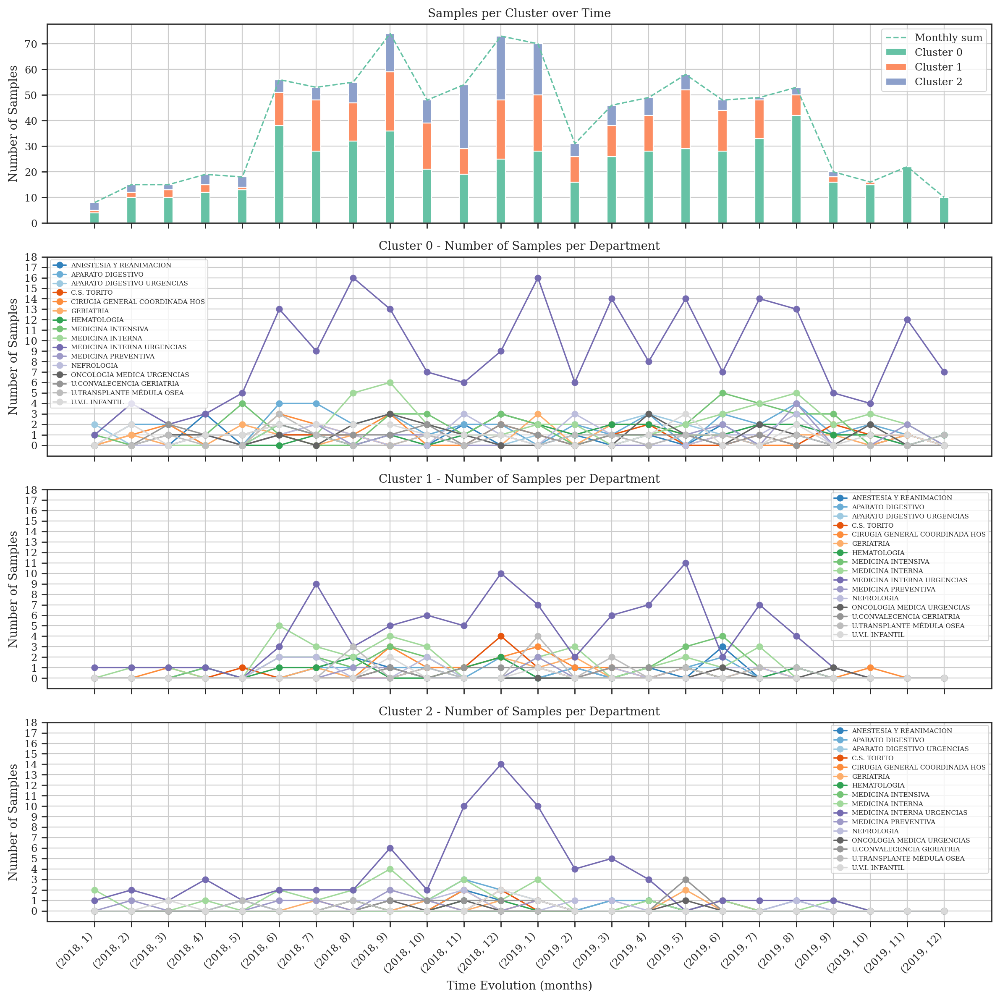

In [61]:
for key, value in complete_clusters_info_dict.items():
    if key == 'Ct. bins':
        test = plot_samples_over_time(
            value, 
            plot=['SERVICIO'], 
            time_unit='month', 
            figsize=(12, 12),
            th_ser=25
        )

As a final step we reorganize the kernel matrices based on the clustering

In [25]:
def reorder_kernel(kernel, labels):
    if isinstance(labels, list):
        labels = np.array(labels)
    
    # Ordering
    sorted_indices = np.argsort(labels)
    sorted_kernel = kernel[sorted_indices, :][:, sorted_indices]
    
    return sorted_kernel

Non E.Coli representative peaks

In [26]:
peaks_kernel_sorted = {}

for (key, kernel), (_, labels) in zip(peaks_kernel_dict.items(), peaks_cluster_labels_dict.items()):
    sorted_kernel = reorder_kernel(kernel, labels)
    peaks_kernel_sorted[key] = sorted_kernel
    
# show_kernel(peaks_kernel_sorted)

# plt.savefig('c:/Users/rafar/Desktop/UC3M/2nd Semester/6 Master Thesis/Images/peaks_kernel_ordered.png', dpi=500) 
# plt.show()

Complete MALDIs

In [27]:
complete_kernel_sorted = {}

for (key, kernel), (_, labels) in zip(complete_kernel_dict.items(), complete_cluster_labels_dict.items()):
    sorted_kernel = reorder_kernel(kernel, labels)
    complete_kernel_sorted[key] = sorted_kernel
    
# show_kernel(complete_kernel_sorted)

# plt.savefig('c:/Users/rafar/Desktop/UC3M/2nd Semester/6 Master Thesis/Images/complete_kernel_ordered.png', dpi=500) 
# plt.show()

Masked MALDIs

In [28]:
masked_kernel_sorted = {}

for (key, kernel), (_, labels) in zip(masked_kernel_dict.items(), masked_cluster_labels_dict.items()):
    sorted_kernel = reorder_kernel(kernel, labels)
    masked_kernel_sorted[key] = sorted_kernel
    
# show_kernel(masked_kernel_sorted)

# plt.savefig('c:/Users/rafar/Desktop/UC3M/2nd Semester/6 Master Thesis/Images/masked_kernel_ordered.png', dpi=500) 
# plt.show()

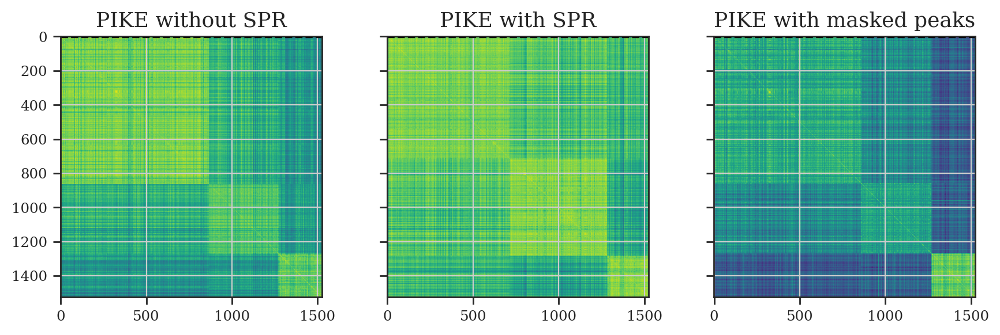

In [36]:
kernels_sorted = {'PIKE without SPR': complete_kernel_sorted['Ct. bins'],
                  'PIKE with SPR': peaks_kernel_sorted['Ct. bins'],
                  'PIKE with masked peaks': masked_kernel_sorted['Ct. bins']
                  }

show_kernels(kernels_sorted, figsize=(9, 3))

plt.savefig('c:/Users/rafar/Desktop/UC3M/2nd Semester/6 Master Thesis/Images/kernels_ordered.png', dpi=500) 
plt.show()